In [1]:
import time
import numpy as np
import h5py
import matplotlib.pyplot as plt
import scipy
from PIL import Image
from scipy import ndimage

np.random.seed(1)

In [2]:
train = h5py.File("C:/Users/ACER/Downloads/Files/Files/train_catvnoncat.h5")

In [3]:
train_file_names = list(train.keys())
train_file_names

['list_classes', 'train_set_x', 'train_set_y']

In [4]:
test = h5py.File("C:/Users/ACER/Downloads/Files/Files/test_catvnoncat.h5") 

In [5]:
test_file_names = list(test.keys())
test_file_names 

['list_classes', 'test_set_x', 'test_set_y']

In [6]:
train_x_orig = np.array(train['train_set_x'])
train_y = np.array(train['train_set_y'])
test_x_orig = np.array(test['test_set_x'])
test_y = np.array(test['test_set_y'])
classes =  np.array(train['list_classes'])

In [7]:
print(train_x_orig.shape) 
print(train_y.shape) 
print(test_x_orig.shape) 
print(test_y.shape) 
print(classes.shape) 

(209, 64, 64, 3)
(209,)
(50, 64, 64, 3)
(50,)
(2,)


 - train_x_orig has 209 images of size (64,64,3)
 - train_y contains the labels of train_x_orig
 
 - test_x_orig has 50 images of size (64,64,3)
 - test_y contains the labels of test_x_orig  
 
 - There are two clases (Cat and Non-cat)

In [8]:
train_y = train_y.reshape(1, 209)
test_y = test_y.reshape(1,50)

In [9]:
print(train_x_orig.shape) 
print(train_y.shape) 
print(test_x_orig.shape) 
print(test_y.shape) 
print(classes.shape) 

(209, 64, 64, 3)
(1, 209)
(50, 64, 64, 3)
(1, 50)
(2,)


y = 0. It's a non-cat picture.


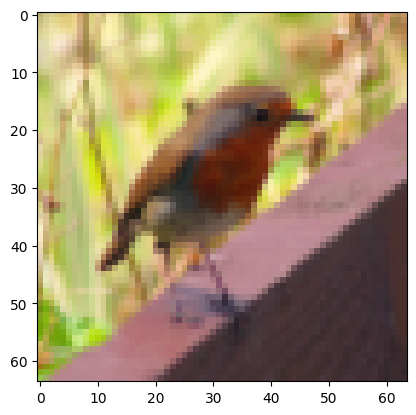

In [10]:
# Example of a picture
index = 10
plt.imshow(train_x_orig[index])
print ("y = " + str(train_y[0,index]) + ". It's a " + classes[train_y[0,index]].decode("utf-8") +  " picture.")

In [11]:
# Explore your dataset 
m_train = train_x_orig.shape[0]
num_px = train_x_orig.shape[1]
m_test = test_x_orig.shape[0]

print ("Number of training examples: " + str(m_train))
print ("Number of testing examples: " + str(m_test))
print ("Each image is of size: (" + str(num_px) + ", " + str(num_px) + ", 3)")
print ("train_x_orig shape: " + str(train_x_orig.shape))
print ("train_y shape: " + str(train_y.shape))
print ("test_x_orig shape: " + str(test_x_orig.shape))
print ("test_y shape: " + str(test_y.shape))

Number of training examples: 209
Number of testing examples: 50
Each image is of size: (64, 64, 3)
train_x_orig shape: (209, 64, 64, 3)
train_y shape: (1, 209)
test_x_orig shape: (50, 64, 64, 3)
test_y shape: (1, 50)


In [12]:
# Reshape the training and test examples 
train_x_flatten = train_x_orig.reshape(train_x_orig.shape[0], -1).T   # The "-1" makes reshape flatten the remaining dimensions
test_x_flatten = test_x_orig.reshape(test_x_orig.shape[0], -1).T

# Standardize data to have feature values between 0 and 1.
train_x = train_x_flatten/255.
test_x = test_x_flatten/255.

print ("train_x's shape: " + str(train_x.shape))
print ("test_x's shape: " + str(test_x.shape))

train_x's shape: (12288, 209)
test_x's shape: (12288, 50)


In [13]:
64*64*3

12288

In [14]:
### CONSTANTS DEFINING THE MODEL ####
n_x = 12288     # num_px * num_px * 3  #input_layer_size
n_h = 7 # hidden_layer_size
n_y = 1 # output_layer_size
layers_dims = (n_x, n_h, n_y)

# Model building 

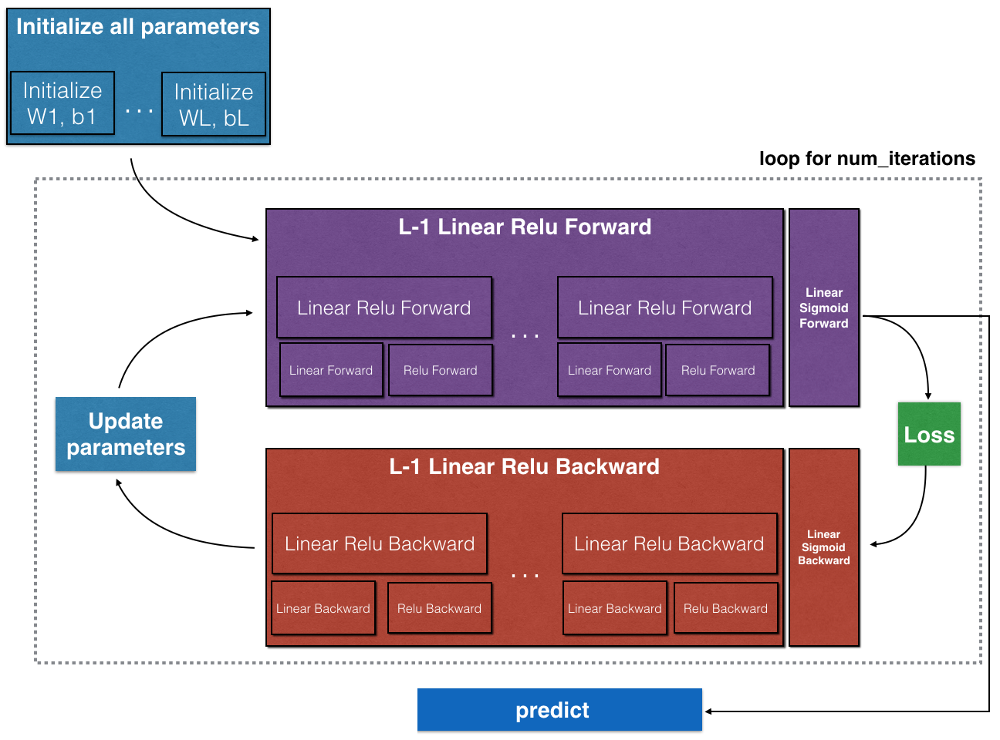

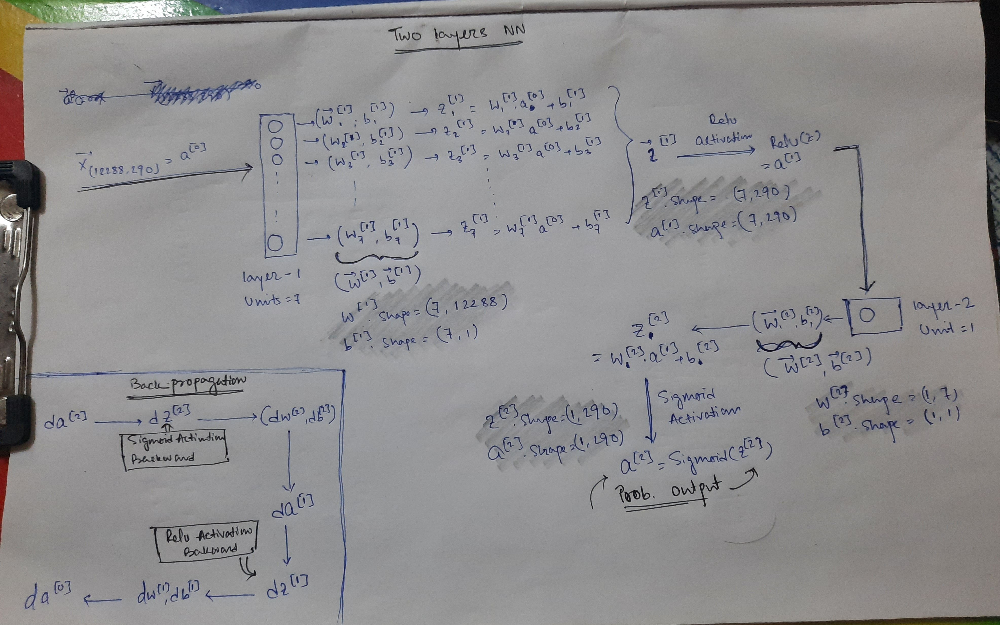

##### Step 1: Initializing parameters

In [15]:
def initialize_parameters(input_layer_size, hidden_layer_size, output_layer_size): 
    
    W1 = np.random.randn(hidden_layer_size, input_layer_size) * 0.01
    b1 = np.zeros((hidden_layer_size,1))
    W2 = np.random.randn(output_layer_size,hidden_layer_size) * 0.01
    b2 = np.zeros((output_layer_size,1))
    
    parameters = {"W1": W1,
                  "b1": b1,
                  "W2": W2,
                  "b2": b2}
    
    return parameters    

In [16]:
parameters = initialize_parameters(3,2,1)

print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))

W1 = [[ 0.01624345 -0.00611756 -0.00528172]
 [-0.01072969  0.00865408 -0.02301539]]
b1 = [[0.]
 [0.]]
W2 = [[ 0.01744812 -0.00761207]]
b2 = [[0.]]


##### Step 2: Forward Propagation

$$Z^{[l]} = W^{[l]}A^{[l-1]} +b^{[l]}\tag{4}$$

- ### Linear Forward

In [17]:
def linear_forward(A, W, b):
    Z = np.dot(W,A) + b

    cache = (A, W, b)
    
    return Z, cache

- ###  Linear-Activation Forward

- ###### **Sigmoid**: $\sigma(Z) = \sigma(W A + b) = \frac{1}{ 1 + e^{-(W A + b)}}$. 

In [18]:
def sigmoid(Z):
    
    A = 1 / (1 + np.exp(-Z))
    activation_cache = Z
    
    return (A, activation_cache) 

- **ReLU**: The mathematical formula for ReLu is $A = RELU(Z) = max(0, Z)$.

In [19]:
def relu(Z):
    
    A = np.maximum(0,Z)
    activation_cache = Z
     
    return (A, activation_cache)  

In [20]:
def linear_activation_forward(A_prev, W, b, activation):
    
    if activation == "sigmoid":
        Z,linear_cache = linear_forward(A_prev, W, b)
        A, activation_cache = sigmoid(Z)

    
    elif activation == "relu":
        Z,linear_cache = linear_forward(A_prev, W, b)
        A, activation_cache = relu(Z)
        
    cache = (linear_cache, activation_cache)

    return A, cache

In [21]:
def L_model_forward(X, parameters):
    """
    Implement forward propagation for the [LINEAR->RELU]*(L-1)->LINEAR->SIGMOID computation
    
    Arguments:
    X -- data, numpy array of shape (input size, number of examples)
    parameters -- output of initialize_parameters_deep()
    
    Returns:
    AL -- activation value from the output (last) layer
    caches -- list of caches containing:
                every cache of linear_activation_forward() (there are L of them, indexed from 0 to L-1)
    """

    caches = []
    A = X
    L = len(parameters) // 2                  # number of layers in the neural network
    for l in range(1, L):
        A_prev = A 
        A, cache = linear_activation_forward(A_prev, parameters["W"+str(l)], parameters["b"+str(l)], activation = 'relu')
        caches.append(cache)

    AL, cache = linear_activation_forward(A, parameters["W"+str(L)], parameters["b"+str(L)], activation = 'sigmoid')
    caches.append(cache)
    
          
    return AL, caches

In [22]:
testing_A_prev = np.random.random((3, 3)) - 0.5
testing_W = np.random.random((1, 3)) - 0.5
testing_b = np.random.random((1, 1)) 

In [23]:
t_A, t_linear_activation_cache = linear_activation_forward(testing_A_prev, testing_W, testing_b, activation = "sigmoid")
print("With sigmoid: A = " + str(t_A)) 

t_A, t_linear_activation_cache = linear_activation_forward(testing_A_prev, testing_W, testing_b, activation = "relu")
print("With ReLU: A = " + str(t_A))

With sigmoid: A = [[0.65408148 0.73317943 0.66862502]]
With ReLU: A = [[0.63702866 1.01081403 0.7019728 ]]


##### Step 3: Cost Function

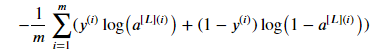

In [24]:
def compute_cost(AL, Y):
    
    m = Y.shape[1]
    
    cost = -(1/m)*np.sum(np.multiply(np.log(AL), Y) + np.multiply((1 - Y), np.log(1 - AL)))
    
    cost = np.squeeze(cost)     
    
    return cost

##### Step 4: Backward Propagation

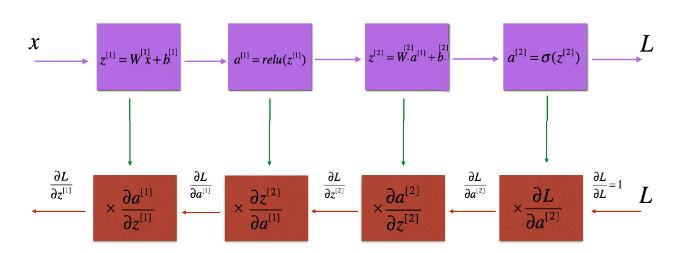

- #### Linear Backward

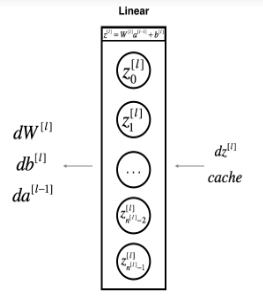

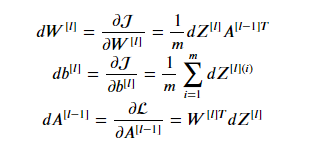

In [25]:
def linear_backward(dZ, cache): # cache: tuple of values (A_prev, W, b) coming from the forward propagation in the current layer
    
    A_prev, W, b = cache
    m = A_prev.shape[1]

    dW = (1/m) * np.dot(dZ,cache[0].T)
    db = (1/m) * np.sum(dZ,axis=1,keepdims=True)
    dA_prev = np.dot(cache[1].T,dZ)

    
    return dA_prev, dW, db

- ####  Linear-Activation Backward

- ###### Sigmoid Backward

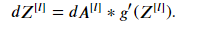

In [26]:
def sigmoid_backward(dA, activation_cache):
    
    Z = activation_cache
    sigmoid = 1 / (1 + np.exp(-Z))
    dZ = dA * sigmoid * (1 - sigmoid)

    return dZ

- ###### ReLU Backward

In [27]:
def relu_backward(dA, activation_cache):

    Z = activation_cache
    dZ = np.array(dA, copy=True)  # Copy dA to create a new array

    # Set dZ to 0 where Z <= 0
    dZ[Z <= 0] = 0

    return dZ

In [28]:
def linear_activation_backward(dA, cache, activation):

    linear_cache, activation_cache = cache # linear_activation_forward(A_prev, W, b, activation)[1]
    
    if activation == "relu":
        dZ = relu_backward(dA, activation_cache)
        dA_prev, dW, db = linear_backward(dZ, linear_cache)
        
    elif activation == "sigmoid":
        dZ = sigmoid_backward(dA, activation_cache)
        dA_prev, dW, db = linear_backward(dZ, linear_cache)        
        
    return dA_prev, dW, db

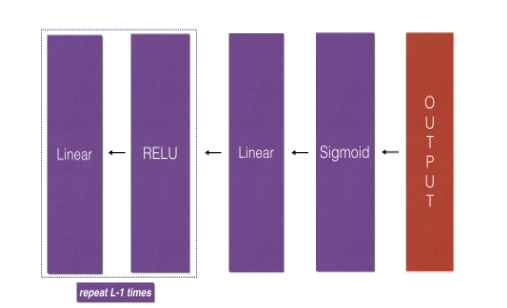

##### Step 5: update_parameters

In [29]:
def update_parameters(params, grads, learning_rate):
    """
    Update parameters using gradient descent
    
    Arguments:
    params -- python dictionary containing your parameters 
    grads -- python dictionary containing your gradients, output of L_model_backward
    
    Returns:
    parameters -- python dictionary containing your updated parameters 
                  parameters["W" + str(l)] = ... 
                  parameters["b" + str(l)] = ...
    """
    parameters = params.copy()
    L = len(parameters) // 2 # number of layers in the neural network

    # Update rule for each parameter. Use a for loop.
    for l in range(L):
        parameters["W" + str(l+1)] = parameters["W" + str(l+1)] - learning_rate*grads["dW" + str(l+1)]
        parameters["b" + str(l+1)] = parameters["b" + str(l+1)] - learning_rate*grads["db" + str(l+1)]
    return parameters

### 2 Layer model 

In [30]:
def two_layer_model(X, Y, layers_dims, learning_rate = 0.0075, num_iterations = 3000, print_cost=False):
    """
    Implements a two-layer neural network: LINEAR->RELU->LINEAR->SIGMOID.
    
    Arguments:
    X -- input data, of shape (n_x, number of examples)
    Y -- true "label" vector (containing 1 if cat, 0 if non-cat), of shape (1, number of examples)
    layers_dims -- dimensions of the layers (n_x, n_h, n_y)
    num_iterations -- number of iterations of the optimization loop
    learning_rate -- learning rate of the gradient descent update rule
    print_cost -- If set to True, this will print the cost every 100 iterations 
    
    Returns:
    parameters -- a dictionary containing W1, W2, b1, and b2
    """
    
    np.random.seed(1)
    grads = {}
    costs = []                              # to keep track of the cost
    m = X.shape[1]                           # number of examples
    (n_x, n_h, n_y) = layers_dims
    
    # Initialize parameters dictionary, by calling one of the functions you'd previously implemented    
    parameters = initialize_parameters(n_x, n_h, n_y)
    
    # YOUR CODE ENDS HERE
    
    # Get W1, b1, W2 and b2 from the dictionary parameters.
    W1 = parameters["W1"]
    b1 = parameters["b1"]
    W2 = parameters["W2"]
    b2 = parameters["b2"]
    
    # Loop (gradient descent)
    for i in range(0, num_iterations):

        # Forward propagation: LINEAR -> RELU -> LINEAR -> SIGMOID. Inputs: "X, W1, b1, W2, b2". Output: "A1, cache1, A2, cache2".
        A1, cache1 = linear_activation_forward(X, W1, b1, "relu")
        A2, cache2 = linear_activation_forward(A1, W2, b2, "sigmoid")
        
        # Compute cost        
        cost = compute_cost(A2, Y)

        # Initializing backward propagation
        dA2 = - (np.divide(Y, A2) - np.divide(1 - Y, 1 - A2)) # Derivative of Log-loss,Log-loss = - [Y*log(A2) + (1-Y)*log(1-A2)]
        
        # Backward propagation. Inputs: "dA2, cache2, cache1". Outputs: "dA1, dW2, db2; also dA0 (not used), dW1, db1".
        dA1, dW2, db2 = linear_activation_backward(dA2, cache2, activation='sigmoid')
        dA0, dW1, db1 =  linear_activation_backward(dA1, cache1, activation='relu')
        
        # Set grads['dWl'] to dW1, grads['db1'] to db1, grads['dW2'] to dW2, grads['db2'] to db2
        grads['dW1'] = dW1
        grads['db1'] = db1
        grads['dW2'] = dW2
        grads['db2'] = db2
        
        
        parameters = update_parameters(parameters, grads, learning_rate)
        

        # Retrieve W1, b1, W2, b2 from parameters
        W1 = parameters["W1"]
        b1 = parameters["b1"]
        W2 = parameters["W2"]
        b2 = parameters["b2"]
        
        # Print the cost every 100 iterations
        if print_cost and i % 100 == 0 or i == num_iterations - 1:
            print("Cost after iteration {}: {}".format(i, np.squeeze(cost)))
        if i % 100 == 0 or i == num_iterations:
            costs.append(cost)

    return parameters, costs

def plot_costs(costs, learning_rate=0.0075):
    plt.plot(np.squeeze(costs))
    plt.ylabel('cost')
    plt.xlabel('iterations (per hundreds)')
    plt.title("Learning rate =" + str(learning_rate))
    plt.show()

In [39]:
train_x.shape

(12288, 209)

In [31]:
n_x = 12288     # num_px * num_px * 3
n_h = 7
n_y = 1
layers_dims = (n_x, n_h, n_y)
learning_rate = 0.0075

Cost after iteration 0: 0.693049735659989
Cost after iteration 100: 0.6464320953428849
Cost after iteration 200: 0.6325140647912677
Cost after iteration 300: 0.6015024920354665
Cost after iteration 400: 0.5601966311605747
Cost after iteration 500: 0.5158304772764729
Cost after iteration 600: 0.47549013139433266
Cost after iteration 700: 0.43391631512257495
Cost after iteration 800: 0.4007977536203887
Cost after iteration 900: 0.35807050113237976
Cost after iteration 1000: 0.3394281538366413
Cost after iteration 1100: 0.3052753636196264
Cost after iteration 1200: 0.2749137728213015
Cost after iteration 1300: 0.24681768210614846
Cost after iteration 1400: 0.19850735037466102
Cost after iteration 1500: 0.17448318112556632
Cost after iteration 1600: 0.17080762978096284
Cost after iteration 1700: 0.11306524562164731
Cost after iteration 1800: 0.09629426845937154
Cost after iteration 1900: 0.08342617959726865
Cost after iteration 2000: 0.07439078704319087
Cost after iteration 2100: 0.0663074

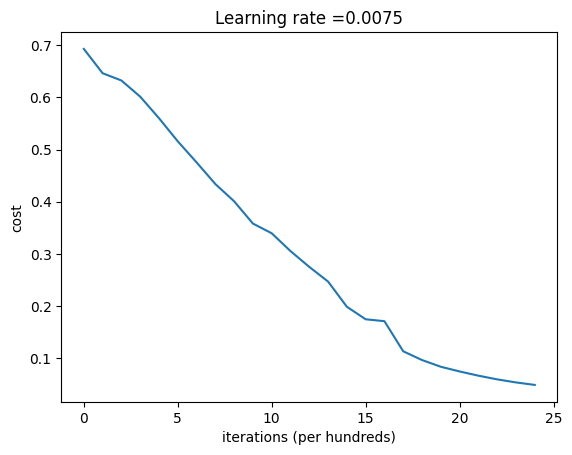

In [32]:
parameters, costs = two_layer_model(train_x, train_y, layers_dims = (n_x, n_h, n_y), num_iterations = 2500, print_cost=True)
plot_costs(costs, learning_rate)

In [33]:
parameters

{'W1': array([[ 0.00237249,  0.01381408, -0.00332973, ..., -0.00287261,
          0.00985644, -0.01594173],
        [ 0.0098258 ,  0.00202003, -0.00687092, ...,  0.00677836,
         -0.00508518,  0.00200851],
        [-0.00271869, -0.00126495,  0.00750106, ...,  0.00860363,
         -0.00069827, -0.00714551],
        ...,
        [-0.0144189 ,  0.01795488, -0.0175508 , ...,  0.01557513,
          0.0264295 , -0.01378799],
        [ 0.00500228,  0.00352009, -0.00089063, ..., -0.00558343,
          0.00325066,  0.00229948],
        [ 0.00430681,  0.01980979, -0.01697934, ...,  0.01729185,
         -0.01321734,  0.00549953]]),
 'b1': array([[ 0.02396302],
        [-0.00020471],
        [ 0.00046645],
        [-0.00011382],
        [ 0.00350855],
        [ 0.00030484],
        [ 0.01772838]]),
 'W2': array([[-1.48205314,  0.02574556, -0.08004842,  0.11531781, -0.85465264,
          0.01973873,  0.60894726]]),
 'b2': array([[0.03392344]])}

In [34]:
print("Shape of 'W1':", parameters['W1'].shape)
print("Shape of 'b1':", parameters['b1'].shape)
print("Shape of 'W2':", parameters['W2'].shape) 
print("Shape of 'b2':", parameters['b2'].shape)

Shape of 'W1': (7, 12288)
Shape of 'b1': (7, 1)
Shape of 'W2': (1, 7)
Shape of 'b2': (1, 1)


In [35]:
predict = L_model_forward(train_x, parameters)[0]
print("Shape of final output:", predict.shape)

Shape of final output: (1, 209)


In [36]:
def accuracy(parameters, x_train, y_train):
    predict = L_model_forward(x_train, parameters)[0]
    predict = np.where(predict > 0.5, 1, 0)
    err = predict - y_train
    
    count_zero = 0
    for i in err[0]:
        if i == 0:
            count_zero = count_zero + 1
        else:
            pass
    accuracy = count_zero / y_train.shape[1]
    
    return round(accuracy,2)

In [37]:
accuracy(parameters, train_x, train_y)

1.0

In [38]:
accuracy(parameters, test_x, test_y)

0.72